<a href="https://colab.research.google.com/github/jong104b-kr/AIFFEL_quest_cr/blob/master/Exploration/Quest06/ExCR12_12.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 모델 준비하기
✅ Diffusers를 설치

In [1]:
!pip install --upgrade -qq git+https://github.com/huggingface/diffusers.git transformers accelerate
# !pip install -U triton


  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.4/10.4 MB 114.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 354.7/354.7 kB 30.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 481.4/481.4 kB 38.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 26.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 26.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 63.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.3 MB

In [2]:
import diffusers
print(diffusers.__version__)


0.34.0.dev0


# Text-to-Image Generation
✅ 파이프라인 불러오기

In [3]:
import torch
from diffusers import DiffusionPipeline, DPMSolverMultistepScheduler

device = "cuda"

# 파이프라인 불러오기
repo_id = "stabilityai/stable-diffusion-2-base"
pipe = DiffusionPipeline.from_pretrained(repo_id, torch_dtype=torch.float16)

pipe.scheduler = DPMSolverMultistepScheduler.from_config(pipe.scheduler.config)
pipe = pipe.to(device)

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/537 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

model.safetensors:   0%|          | 0.00/1.36G [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/738 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.46G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/929 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/716 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/1.01k [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

✅ 프롬프트 입력  

Positive Prompt:  

a wooden luxurious chessboard. It has to be set most pieces on.

In [15]:
prompt = str(input('prompt: '))  # 프롬프트를 영어로 입력해보세요

prompt: a wooden luxurious chessboard. It has to be set most pieces on.


  0%|          | 0/25 [00:00<?, ?it/s]

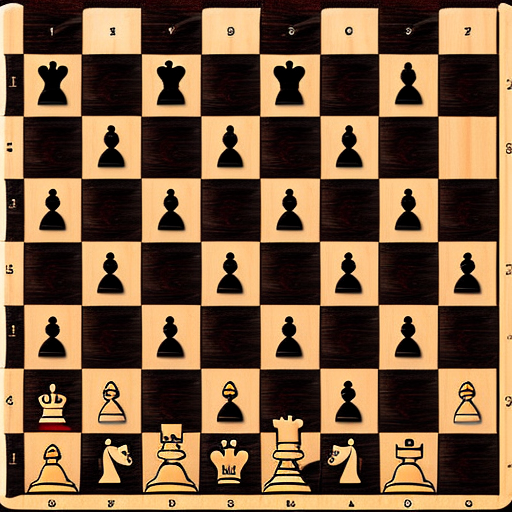

In [19]:
# 입력한 프롬프트를 사용하여 이미지 생성
image = pipe(prompt, num_inference_steps=25).images[0]

# 이미지 출력
image

✅ 하이퍼파라미터를 변화

- height, width: 생성될 이미지의 가로와 세로 픽셀 크기를 조절할 수 있습니다. 8의 배수로 설정해 주세요.
- num_inference_steps: denoising 스텝 수로, 값이 커질수록 고해상도 이미지가 출력되지만 출력되는 시간이 오래 걸립니다. default 값은 50입니다.
- guidance_scale: 얼마나 주어진 프롬프트에 근접한 이미지를 생성할지를 설정하는 하이퍼파라미터로, 값이 커질수록 문자열에 근접한 이미지가 생성되지만 이미지 품질이 떨어질 수 있습니다. default는 7.5입니다.





### 실험 1 : 이미지 사이즈 변화
- 크기가 작으면 결과가 더 잘나올거 같음
- 프롬프트 동일하게 크기만 변경

In [20]:
# ===== 사용자 지정 하이퍼파라미터 =====
HEIGHT  = 320   # 8의 배수
WIDTH   = 320   # 8의 배수
STEPS   = 50    # num_inference_steps (기본 50)
GUIDANCE = 7.5  # guidance_scale (기본 7.5)
# ====================================


In [21]:
prompt = str(input('prompt: '))  # 프롬프트를 영어로 입력해보세요

prompt: a wooden luxurious chessboard. It has to be set most pieces on.


  0%|          | 0/50 [00:00<?, ?it/s]

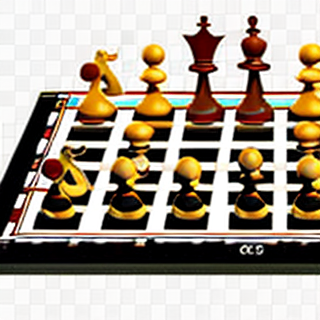

In [22]:
image = pipe(
    prompt,
    height=HEIGHT,
    width=WIDTH,
    num_inference_steps=STEPS,
    guidance_scale=GUIDANCE
).images[0]

# 이미지 출력
image

### 실험 2 : 스텝수 변경
- 50 에서 100 으로 변경
- 고해상도 이미지를 만들어보자


In [23]:
# ===== 사용자 지정 하이퍼파라미터 =====
HEIGHT  = 320   # 8의 배수
WIDTH   = 320   # 8의 배수
STEPS   = 100    # num_inference_steps (기본 50)
GUIDANCE = 7.5  # guidance_scale (기본 7.5)
# ====================================


In [24]:
prompt = str(input('prompt: '))  # 프롬프트를 영어로 입력해보세요

prompt: a wooden luxurious chessboard. It has to be set most pieces on.


  0%|          | 0/100 [00:00<?, ?it/s]

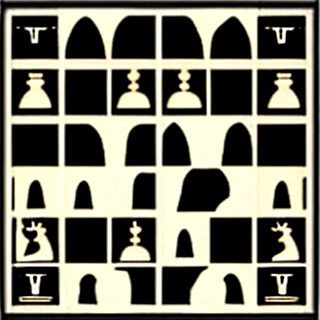

In [25]:
image = pipe(
    prompt,
    height=HEIGHT,
    width=WIDTH,
    num_inference_steps=STEPS,
    guidance_scale=GUIDANCE
).images[0]

# 이미지 출력
image

✅ 해삳도를 높이니, 그림이 사진처럼 되어버림   
✅ 반 고흐 사진에 그림 마스크를 합성한 느낌

### 실험 3 : guidance_scale 하향 조정
- 2 정도로 조정
- 프롬프트와 상관없는 이미지 생성 목적

In [26]:
# ===== 사용자 지정 하이퍼파라미터 =====
HEIGHT  = 320   # 8의 배수
WIDTH   = 320   # 8의 배수
STEPS   = 50    # num_inference_steps (기본 50)
GUIDANCE = 2  # guidance_scale (기본 7.5)
# ====================================


In [27]:
prompt = str(input('prompt: '))  # 프롬프트를 영어로 입력해보세요

prompt: a wooden luxurious chessboard. It has to be set most pieces on.


  0%|          | 0/50 [00:00<?, ?it/s]

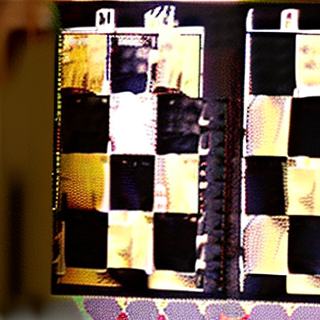

In [28]:
image = pipe(
    prompt,
    height=HEIGHT,
    width=WIDTH,
    num_inference_steps=STEPS,
    guidance_scale=GUIDANCE
).images[0]

# 이미지 출력
image

✅ 전혀 상관없는 품질이 떨어지는 그림이 나옴

# 여러 개의 이미지 생성하기

파이썬 라이브러리인 pillow를 사용

In [29]:
# 파이썬 이미지 처리 라이브러리 pillow 불러오기
from PIL import Image

# 틀 만들기
def image_grid(imgs, rows, cols):
    assert len(imgs) == rows * cols

    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols * w, rows * h))
    grid_w, grid_h = grid.size

    for i, img in enumerate(imgs):
        grid.paste(img, box = (i%cols * w, i // cols * h))
    return grid

In [30]:
# ===== 사용자 지정 하이퍼파라미터 =====
HEIGHT  = 320   # 8의 배수
WIDTH   = 320   # 8의 배수
STEPS   = 50    # num_inference_steps (기본 50)
GUIDANCE = 7.5  # guidance_scale (기본 7.5)
# ====================================

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

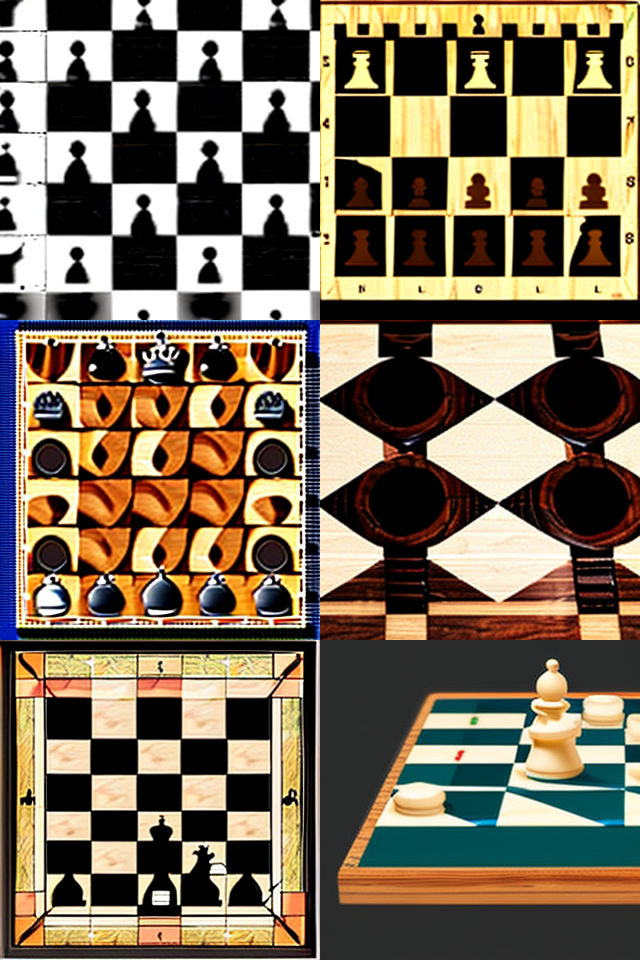

In [32]:
# 이미지의 개수
num_images = 6

# 프롬프트 입력
prompt = "a wooden luxurious chessboard. It has to be set most pieces on."
prompts = [prompt] * num_images

# 이미지 생성
images = [pipe(
    prompt,
    height=HEIGHT,
    width=WIDTH,
    num_inference_steps=STEPS,
    guidance_scale=GUIDANCE
).images[0] for _ in range(num_images)]

# 이미지 출력
grid = image_grid(images, rows= 3, cols= 2)
grid

✅ 처음에는 쓸만한게 없었는데 계속 돌리다 보니 괜찮은 이미지가 생성  
✅ 같은 프롬프트를 써서 여러장의 이미지를 출력하는 것이 하나의 이미지를 생성 하는 것 보다 선택의 폭이 넓어짐

# 프로젝트: ControlNet으로 조건을 준 이미지 생성하기

### ControlNet이란?
- 생성된 이미지를 원하는 대로 출력
- 추가 조건을 추가하여 출력되는 이미지를 쉽게 제어
- 훈련 데이터가 작아도 학습이 잘 되고 빠름

전처리기 종류
- 외곽선 감지(Canny Edge detection)
- 인체 자세 감지(Human pose)
- 낙서 지도(Scribble map)
- 시맨틱 세그멘테이션(Semantic segmentation)

In [33]:
# !pip install -qq diffusers==0.31

In [34]:
# 메모리 삭제
# torch.cuda.empty_cache()

### Canny 윤곽선 검출

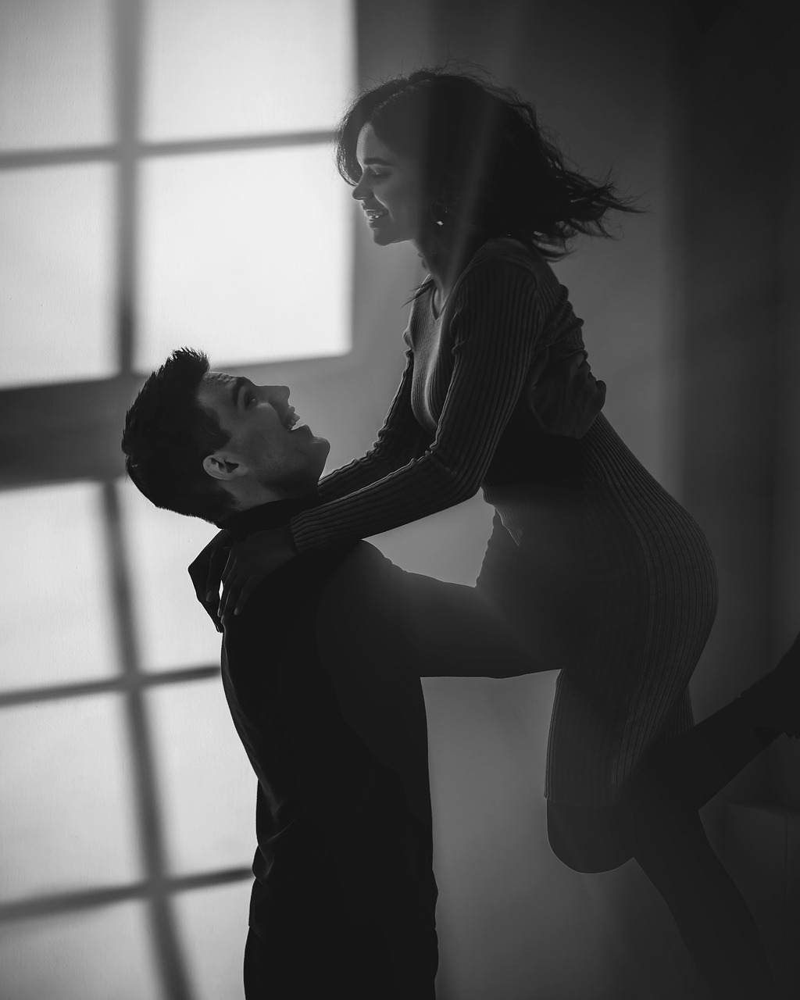

In [35]:
import torch
from diffusers import StableDiffusionControlNetPipeline
from diffusers.utils import load_image

# 이미지 불러오기
image = load_image(
    "https://cdn.pixabay.com/photo/2019/07/08/19/36/couple-4325416_1280.jpg"
)

image

### OpenCV

이미지의 윤곽선을 검출

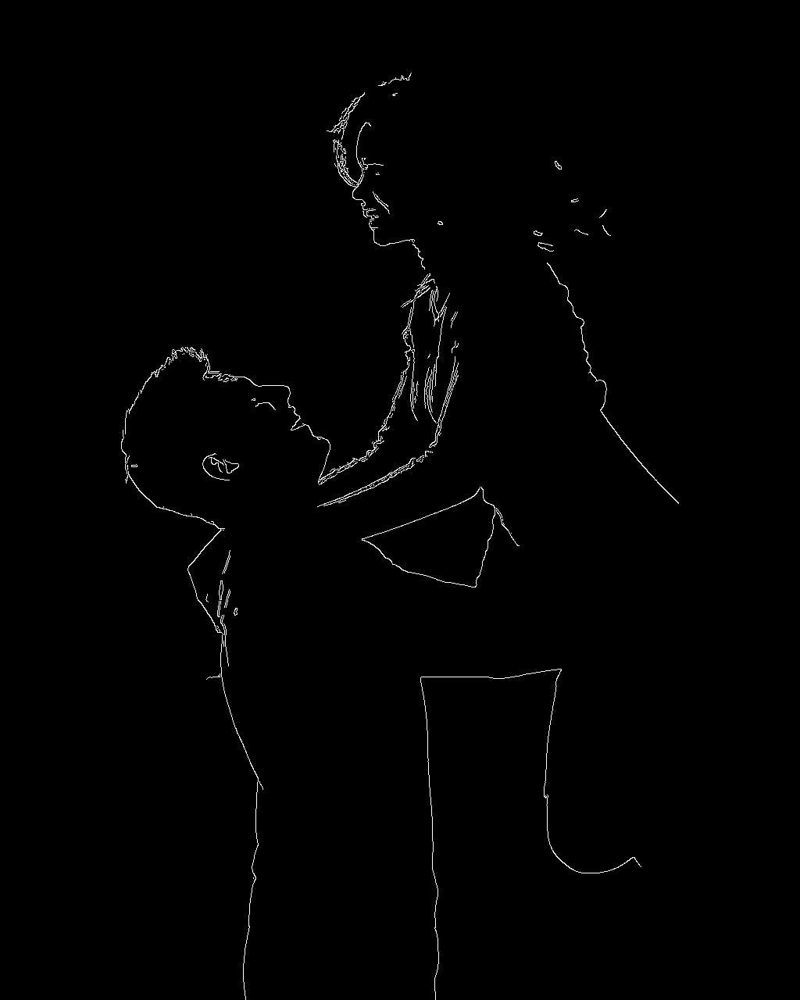

In [36]:
import cv2
from PIL import Image
import numpy as np

# 이미지를 NumPy 배열로 변환합니다.
image = np.array(image)

# threshold를 지정합니다.
low_threshold = 100
high_threshold = 200

# 윤곽선을 검출합니다.
image = cv2.Canny(image, low_threshold, high_threshold)
image = image[:, :, None]
image = np.concatenate([image, image, image], axis=2)
canny_image = Image.fromarray(image)  # NumPy 배열을 PIL 이미지로 변환합니다.

canny_image

윤곽선 검출 전처리기를 사용한 모델 파이프라인 불러오기

In [37]:
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel

canny_controlnet = ControlNetModel.from_pretrained("lllyasviel/sd-controlnet-canny", torch_dtype=torch.float16)
canny_pipe = StableDiffusionControlNetPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5", controlnet=canny_controlnet, torch_dtype=torch.float16
)

config.json:   0%|          | 0.00/920 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/1.45G [00:00<?, ?B/s]

model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/4.72k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

윤곽선을 추출한 이미지에 프롬프트를 적용하여 새로운 이미지를 생성

  0%|          | 0/20 [00:00<?, ?it/s]

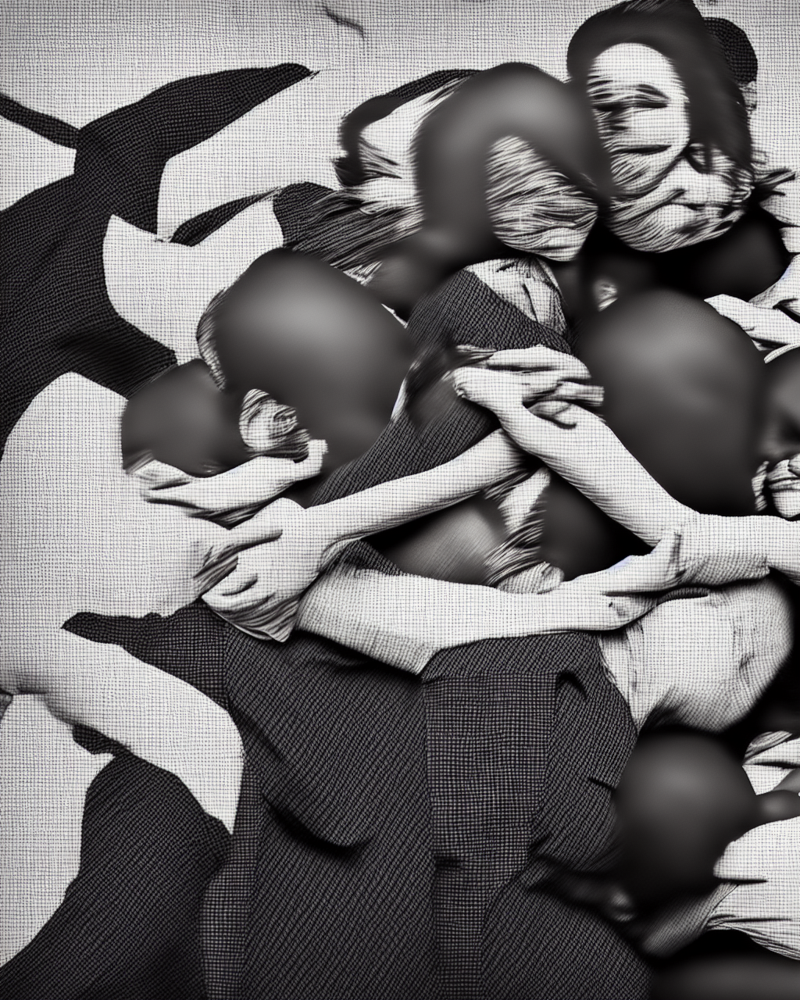

In [39]:
from diffusers import UniPCMultistepScheduler
canny_pipe.scheduler = UniPCMultistepScheduler.from_config(canny_pipe.scheduler.config)
canny_pipe = canny_pipe.to("cuda")

# 동일한 이미지를 생성하기 위해 seed를 지정합니다.
generator = torch.manual_seed(0)

# 이미지를 생성합니다.
canny_image = canny_pipe(
    prompt="hugging with daddy and daughter",
    num_inference_steps=20,
    generator=generator,
    image=canny_image
).images[0]

# 생성된 이미지를 출력합니다.
canny_image

✅ 너무 무서운 사진, 아직 두 사람의 윤곽선은 힘든다보다.

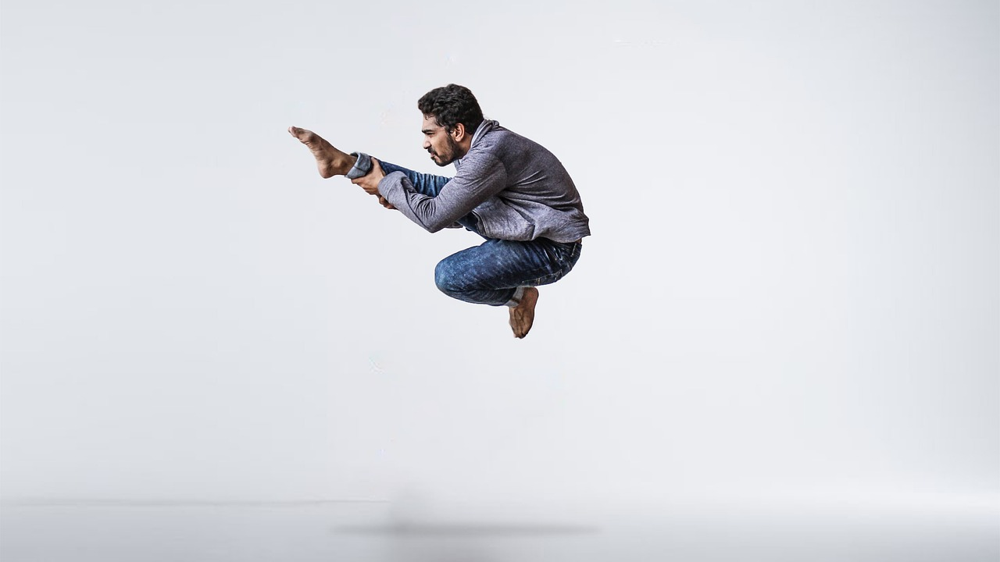

In [40]:
import torch
from diffusers import StableDiffusionControlNetPipeline
from diffusers.utils import load_image

# 이미지 불러오기
image = load_image(
    "https://cdn.pixabay.com/photo/2020/10/07/15/20/man-5635507_1280.jpg"
)

image

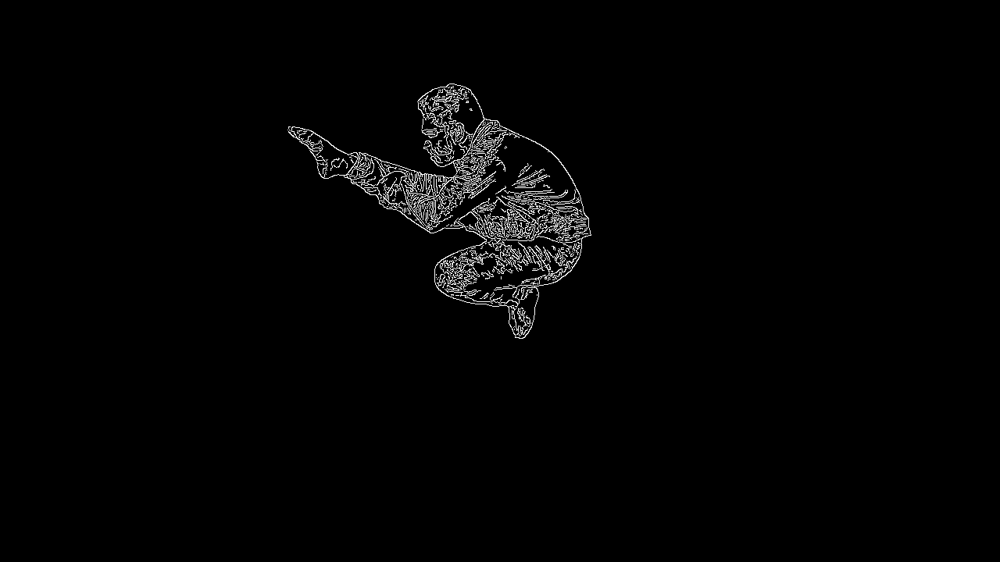

In [41]:
import cv2
from PIL import Image
import numpy as np

# 이미지를 NumPy 배열로 변환합니다.
image = np.array(image)

# threshold를 지정합니다.
low_threshold = 100
high_threshold = 200

# 윤곽선을 검출합니다.
image = cv2.Canny(image, low_threshold, high_threshold)
image = image[:, :, None]
image = np.concatenate([image, image, image], axis=2)
canny_image = Image.fromarray(image)  # NumPy 배열을 PIL 이미지로 변환합니다.

canny_image

  0%|          | 0/20 [00:00<?, ?it/s]

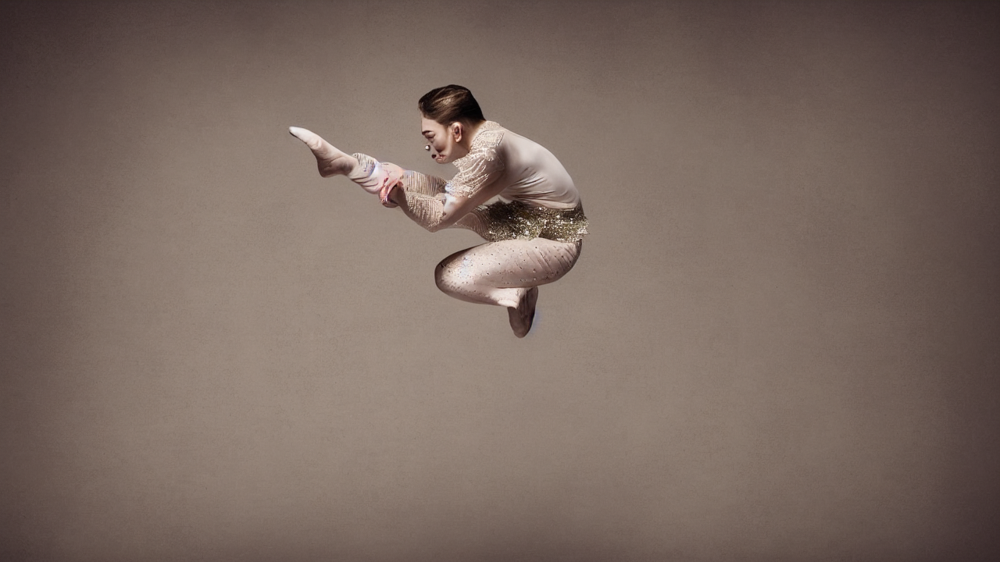

In [42]:
from diffusers import UniPCMultistepScheduler
canny_pipe.scheduler = UniPCMultistepScheduler.from_config(canny_pipe.scheduler.config)
canny_pipe = canny_pipe.to("cuda")

# 동일한 이미지를 생성하기 위해 seed를 지정합니다.
generator = torch.manual_seed(0)

# 이미지를 생성합니다.
canny_image = canny_pipe(
    prompt="A graceful ballerina captured mid-jump Her expression exudes focus and elegance",
    num_inference_steps=20,
    generator=generator,
    image=canny_image
).images[0]

# 생성된 이미지를 출력합니다.
canny_image

✅ 아놔~~ 거 너무한거 아니오!!!

### 인체 자세 감지

Openpose
- 인체 자세 감지(Human pose)를 할 수 있는 전처리기
- 자세를 감지하여 새로운 이미지를 생성

In [43]:
!pip install controlnet-aux==0.0.1

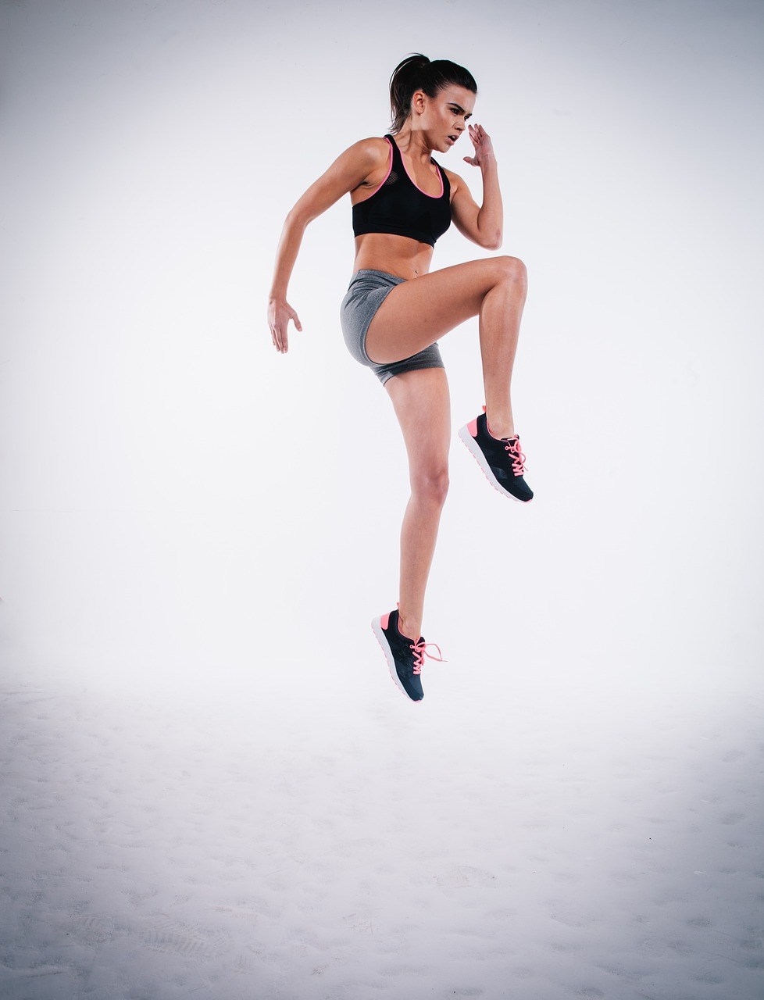

In [44]:
from diffusers.utils import load_image

openpose_image = load_image(
    "https://cdn.pixabay.com/photo/2016/11/22/21/38/action-1850677_1280.jpg"
)
openpose_image


Openpose 검출기를 사용하여 자세 추출

body_pose_model.pth:   0%|          | 0.00/209M [00:00<?, ?B/s]

cuda


/usr/local/lib/python3.11/dist-packages/controlnet_aux/open_pose/body.py:17: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model_dict = util.transfer(self.model, torch.load(

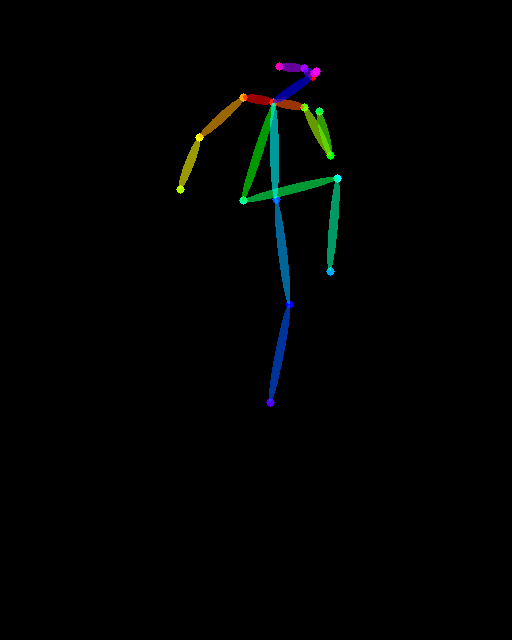

In [45]:
from controlnet_aux import OpenposeDetector

# 인체의 자세를 검출하는 사전 학습된 ControlNet 불러오기
openpose = OpenposeDetector.from_pretrained("lllyasviel/ControlNet")

# 이미지에서 자세 검출
openpose_image = openpose(openpose_image)
openpose_image

Openpose 전처리기를 사용한 모델 파이프라인을 불러오기

In [46]:
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel

openpose_controlnet = ControlNetModel.from_pretrained("lllyasviel/sd-controlnet-openpose", torch_dtype=torch.float16)
openpose_pipe = StableDiffusionControlNetPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5", controlnet=openpose_controlnet, torch_dtype=torch.float16
)

config.json:   0%|          | 0.00/920 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/1.45G [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

이미지 생성

  0%|          | 0/40 [00:00<?, ?it/s]

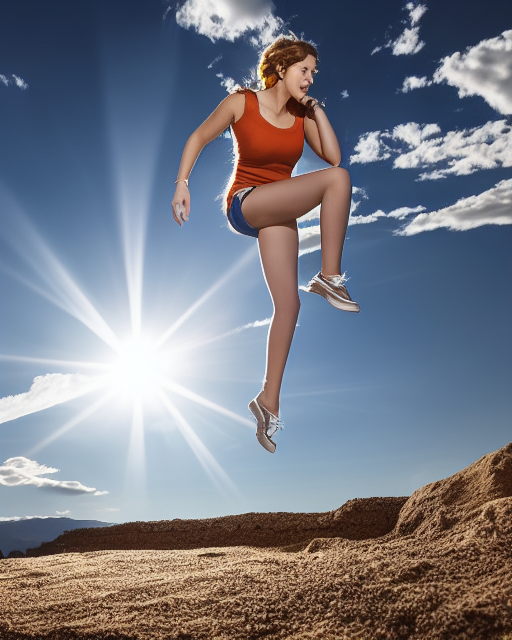

In [47]:
from diffusers import UniPCMultistepScheduler
import torch

# 스케줄러 교체 & 모델을 CUDA로 이동
openpose_pipe.scheduler = UniPCMultistepScheduler.from_config(openpose_pipe.scheduler.config)
openpose_pipe = openpose_pipe.to("cuda")

# ✅ 동일한 이미지를 생성하기 위해 seed를 고정
generator = torch.manual_seed(0)

# ✅ 프롬프트 설정
prompt = "woman, jump, sunlight, 4k"
negative_prompt = "low quality, blurry, distorted, deformed"

# ✅ 이미지 생성
openpose_image1 = openpose_pipe(
    prompt=prompt,
    negative_prompt=negative_prompt,
    controlnet_conditioning_scale=2.0,   # 보통 0.5 ~ 2.0 사이에서 조정
    num_inference_steps=40,
    generator=generator,
    image=openpose_image                # ← OpenPose 조건 이미지 입력
).images[0]

# ✅ 이미지 출력
openpose_image1